In [1]:
import torch
import numpy as np
import kornia as K
import matplotlib.pyplot as plt
import matplotlib
from tqdm import tqdm

# 1 Canny edge detection

## The input image
In this part I read the input image and convert to grayscale using Kornia functions.

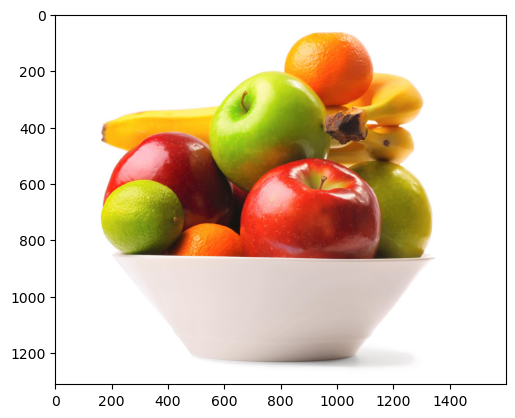

In [2]:
img_temp = plt.imread("bowl-of-fruit.jpg").astype(np.float32) / 255.0
plt.imshow(img_temp)
plt.show()

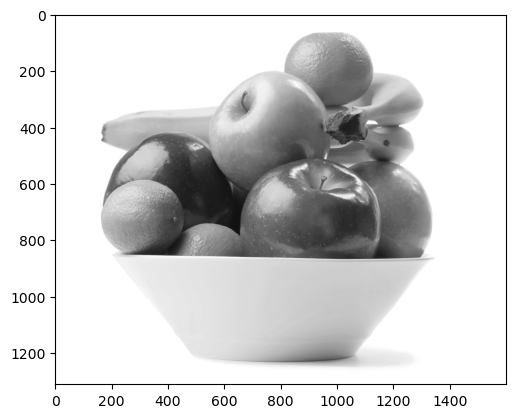

In [3]:
img_tensor = K.image_to_tensor(img_temp)
img_gray = K.color.rgb_to_grayscale(img_tensor).unsqueeze(0)
img_vis = K.tensor_to_image(img_gray)
plt.imshow(img_vis, 'gray')
plt.show()

## Step 1: Gaussian Derivative Filtering

In this step we need to filter the image by derivative of a gaussian kernel. I use the second solution presented in the lecture slides. We have:
$$\frac{\partial}{\partial x}g(x, y;\sigma) = -\frac{x}{2\pi\sigma^4}\exp(-\frac{x^2+y^2}{2\sigma^2})$$
Similarly:
$$\frac{\partial}{\partial y}g(x, y;\sigma) = -\frac{y}{2\pi\sigma^4}\exp(-\frac{x^2+y^2}{2\sigma^2})$$
Then I apply these filters on the input image to get the X and Y direction gradients. Note that the gradients might be negative. However, matplotlib didn't raise an error on my computer, so I didn't take the absolute value of the outputs.

In [4]:
def g_derivative(sigma):
    k_size = int(torch.ceil(torch.tensor(3 * sigma)).item())
    coordinate_y = torch.matmul(torch.arange(-k_size, k_size+1, dtype=torch.float32).reshape((2*k_size+1,1)), torch.ones((1, 2*k_size+1)))
    coordinate_x = torch.permute(coordinate_y, (1, 0))    
    gd_x = -1 / (2 * torch.pi * sigma ** 2) * coordinate_x * torch.exp(-(coordinate_x ** 2 + coordinate_y ** 2) / (2 * sigma ** 2))
    gd_y = -1 / (2 * torch.pi * sigma ** 2) * coordinate_y * torch.exp(-(coordinate_x ** 2 + coordinate_y ** 2) / (2 * sigma ** 2))
    return gd_x.unsqueeze(0), gd_y.unsqueeze(0)

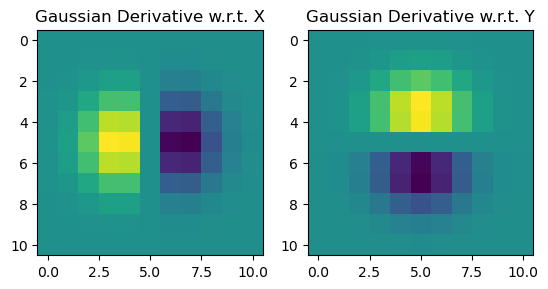

In [5]:
gd_x_temp, gd_y_temp = g_derivative(1.5)
fig, ax = plt.subplots(nrows=1, ncols=2)
ax[0].imshow(K.tensor_to_image(gd_x_temp))
ax[0].set_title("Gaussian Derivative w.r.t. X")
ax[1].imshow(K.tensor_to_image(gd_y_temp))
ax[1].set_title("Gaussian Derivative w.r.t. Y")
plt.show()

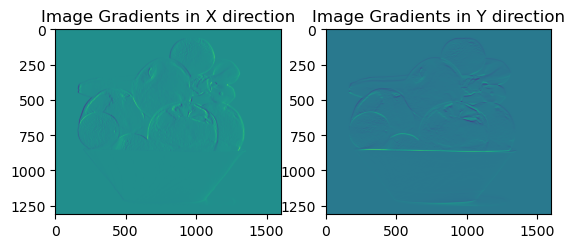

In [6]:
img_gd_x = K.filters.filter2d(img_gray, gd_x_temp, behaviour='conv')
img_gd_y = K.filters.filter2d(img_gray, gd_y_temp, behaviour='conv')
fig, ax = plt.subplots(nrows=1, ncols=2)
ax[0].imshow(K.tensor_to_image(img_gd_x))
ax[0].set_title("Image Gradients in X direction")
ax[1].imshow(K.tensor_to_image(img_gd_y))
ax[1].set_title("Image Gradients in Y direction")
plt.show()

## Step 2: Get Gradient magnitude and direction

In this step, I compute the magnitude and direction of the gradient. The computing the former is straightforward. For the later one, I use PyTorch built-in function torch.atan2 whose output is in range $(-\pi, \pi]$. However, we can only consider the for directions possible and we can't move along any possible direction. Thus, I round the angles to for possible choices of *horizontal*, *vertical*, *diagonal*, and *antidiagonal*.

In [7]:
def approx_dir(gd_ang):
    # horizontal direction
    if -22.5 <= gd_ang <= 22.5 or gd_ang <= -180 + 22.5 or gd_ang >= 180 - 22.5:
        return 0
    # diagonal direction
    elif 22.5 < gd_ang < 90 - 22.5 or -180 + 22.5 < gd_ang < -90 - 22.5:
        return 1
    # vertical direction
    elif 90 - 22.5 <= gd_ang <= 90 + 22.5 or -90 - 22.5 <= gd_ang <= -90 + 22.5:
        return 2
    # antidiagonal direction
    elif 90 + 22.5 < gd_ang < 180 - 22.5 or -90 + 22.5 < gd_ang < -22.5:
        return 3

In [8]:
def gradient_mag_dir(grad_x, grad_y):
    gd_mag = torch.sqrt(grad_x ** 2 + grad_y ** 2)
    gd_ang = torch.atan2(grad_y, grad_x) / torch.pi * 180
    gd_ang.apply_(approx_dir)
    return gd_mag, gd_ang

In [9]:
img_gd_mag, img_gd_dir = gradient_mag_dir(img_gd_x, img_gd_y)

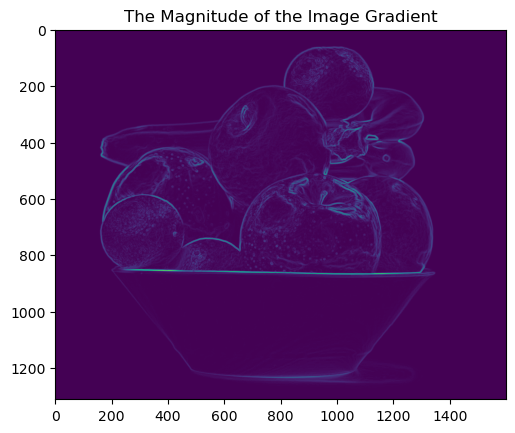

In [10]:
plt.imshow(K.tensor_to_image(img_gd_mag))
plt.title("The Magnitude of the Image Gradient")
plt.show()

## Step 3: Non-Maximum Suppression

In this part I implement the non-maximum suppression algorithm for thinning the edges. I loop over all pixels (except for the pixels on the sides of the image) and for each pixel move along the gradient direction and if the gradient magnitude of the pixel is  greater than all its neighbors in that direction, I consider it as a valid edge and put it in the output.

In [11]:
def non_max_supp(gd_mag, gd_dir):
    _, _, h, w = gd_mag.shape
    gd_mag_out = torch.zeros_like(gd_mag)
    for i in range(1, h-1):
        for j in range(1, w-1):
            if gd_dir[0, 0, i, j] == 0:
                if gd_mag[0, 0, i, j] > gd_mag[0, 0, i, j-1] and gd_mag[0, 0, i, j] > gd_mag[0, 0, i, j+1]:
                    gd_mag_out[0, 0, i, j] = gd_mag[0, 0, i, j]
            elif gd_dir[0, 0, i, j] == 1:
                if gd_mag[0, 0, i, j] > gd_mag[0, 0, i-1, j-1] and gd_mag[0, 0, i, j] > gd_mag[0, 0, i+1, j+1]:
                    gd_mag_out[0, 0, i, j] = gd_mag[0, 0, i, j]
            elif gd_dir[0, 0, i, j] == 2:
                if gd_mag[0, 0, i, j] > gd_mag[0, 0, i-1, j] and gd_mag[0, 0, i, j] > gd_mag[0, 0, i+1, j]:
                    gd_mag_out[0, 0, i, j] = gd_mag[0, 0, i, j]
            elif gd_dir[0, 0, i, j] == 3:
                if gd_mag[0, 0, i, j] > gd_mag[0, 0, i-1, j+1] and gd_mag[0, 0, i, j] > gd_mag[0, 0, i+1, j-1]:
                    gd_mag_out[0, 0, i, j] = gd_mag[0, 0, i, j]
    return gd_mag_out

In [12]:
non_max_supp_gd_mag = non_max_supp(img_gd_mag, img_gd_dir)

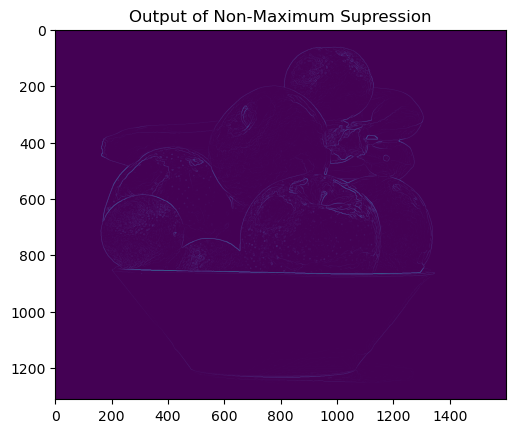

In [13]:
plt.imshow(K.tensor_to_image(non_max_supp_gd_mag))
plt.title("Output of Non-Maximum Supression")
plt.show()

## Threshoulding Without Hystersis

In [14]:
threshold = 0.05
edges = torch.where(non_max_supp_gd_mag > threshold, 1, 0)

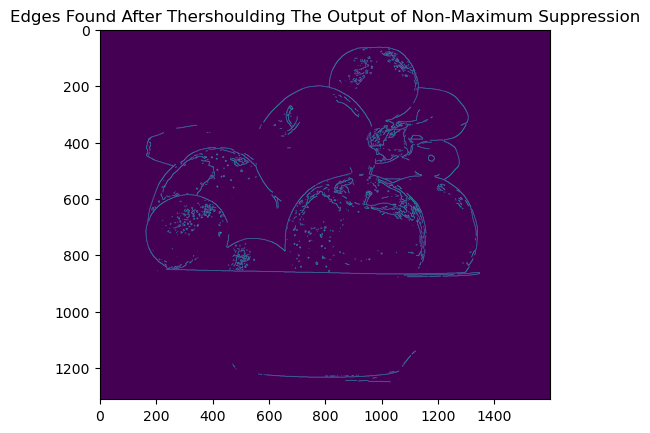

In [15]:
plt.imshow(K.tensor_to_image(edges))
plt.title("Edges Found After Thershoulding The Output of Non-Maximum Suppression")
plt.show()

## Putting It All Together Without Hystersis Thresholding

In [16]:
def MyCanny(image, sigma, tau):
    gd_x_temp, gd_y_temp = g_derivative(sigma)
    img_gd_x = K.filters.filter2d(image, gd_x_temp, behaviour='conv')
    img_gd_y = K.filters.filter2d(image, gd_y_temp, behaviour='conv')
    img_gd_mag, img_gd_dir = gradient_mag_dir(img_gd_x, img_gd_y)
    non_max_supp_gd_mag = non_max_supp(img_gd_mag, img_gd_dir)
    edges = torch.where(non_max_supp_gd_mag > tau, 1, 0)
    return edges

In [17]:
edges = MyCanny(img_gray, sigma=1.5, tau=0.05)

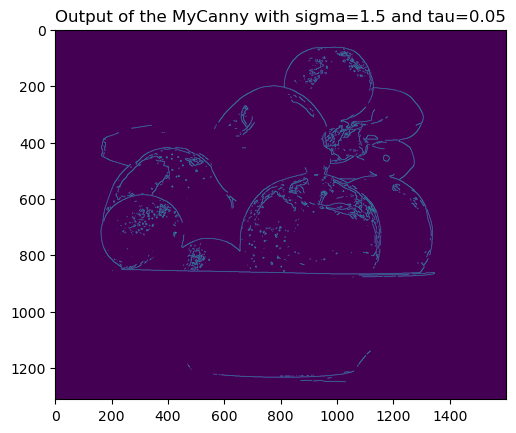

In [18]:
plt.imshow(K.tensor_to_image(edges))
plt.title("Output of the MyCanny with sigma=1.5 and tau=0.05")
plt.show()

## Trying different values for sigma and tau

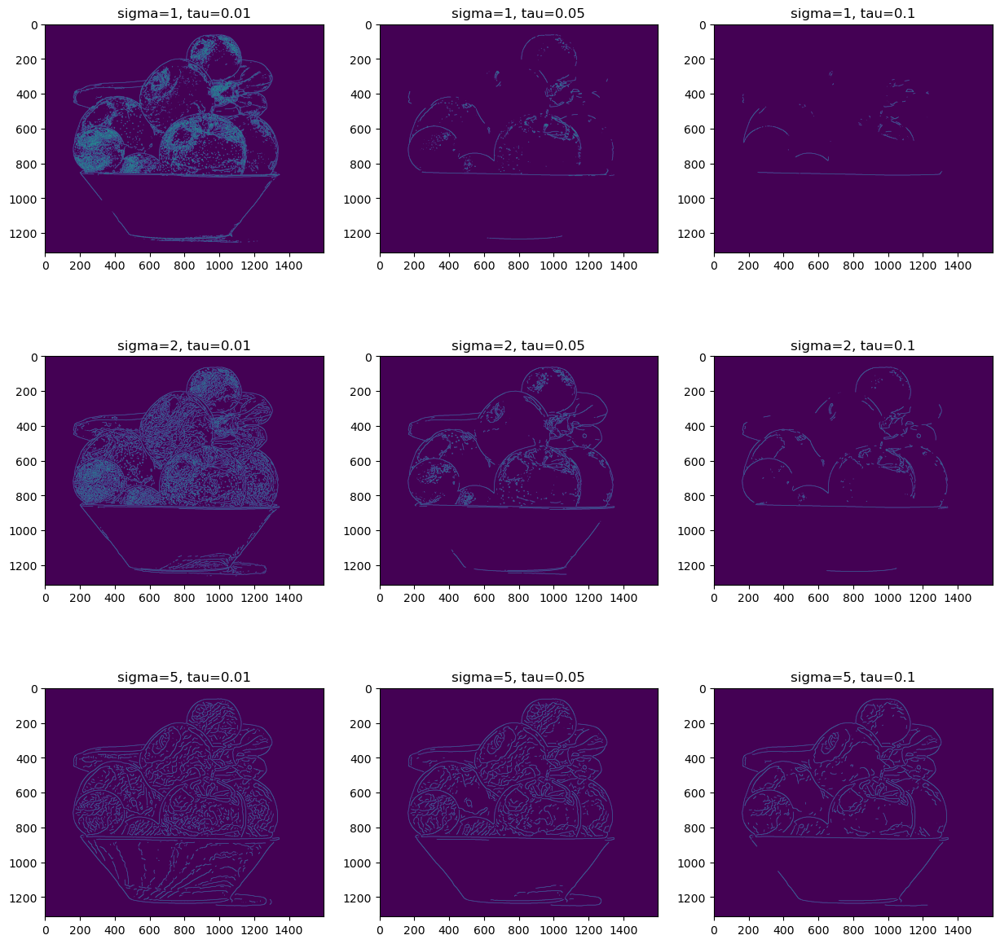

In [19]:
sigmas = [1, 2, 5]
taus = [0.01, 0.05, 0.1]
fig, ax = plt.subplots(nrows=len(sigmas), ncols=len(taus), figsize=(15, 15))
for i, s in enumerate(sigmas):
    for j, t in enumerate(taus):
        edges = MyCanny(img_gray, sigma=s, tau=t)
        ax[i, j].imshow(K.tensor_to_image(edges))
        ax[i, j].set_title(f"sigma={s}, tau={t}")
plt.show()

## Step 4: Hysteresis Thresholding

In this part I add the hystersis which is implemented like BFS.

In [20]:
def hystersis_thresholding(gd_mag, low_tau, high_tau):
    queue = torch.argwhere(gd_mag > high_tau).tolist()
    discovered = torch.where(gd_mag > high_tau, True, False)
    while len(queue) > 0:
        idx = queue.pop(0)
        for i in range(idx[2]-1, idx[2]+2):
            for j in range(idx[3]-1, idx[3]+2):
                if gd_mag[0, 0, i, j] > low_tau and not discovered[0, 0, i, j]:
                    discovered[0, 0, i, j] = True
                    queue.append([0, 0, i, j])
    return discovered.type(torch.float32)

In [21]:
edges = hystersis_thresholding(non_max_supp_gd_mag, 0.01, 0.05)

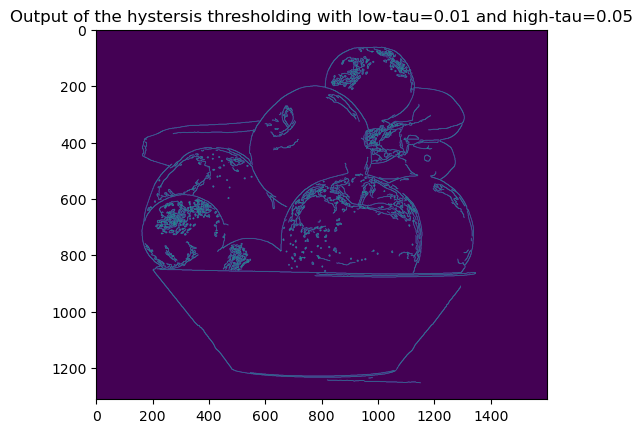

In [22]:
plt.imshow(K.tensor_to_image(edges))
plt.title("Output of the hystersis thresholding with low-tau=0.01 and high-tau=0.05")
plt.show()

## Putting It All Together: Full Version 

In [23]:
def MyCannyFull(image, sigma, low_tau, high_tau):
    gd_x_temp, gd_y_temp = g_derivative(sigma)
    img_gd_x = K.filters.filter2d(image, gd_x_temp, behaviour='conv')
    img_gd_y = K.filters.filter2d(image, gd_y_temp, behaviour='conv')
    img_gd_mag, img_gd_dir = gradient_mag_dir(img_gd_x, img_gd_y)
    non_max_supp_gd_mag = non_max_supp(img_gd_mag, img_gd_dir)
    edges = hystersis_thresholding(non_max_supp_gd_mag, low_tau, high_tau)
    return edges

## Trying different values

I think the result with parameters on second row third column are better, but if want more dense results then third row third column would be better.

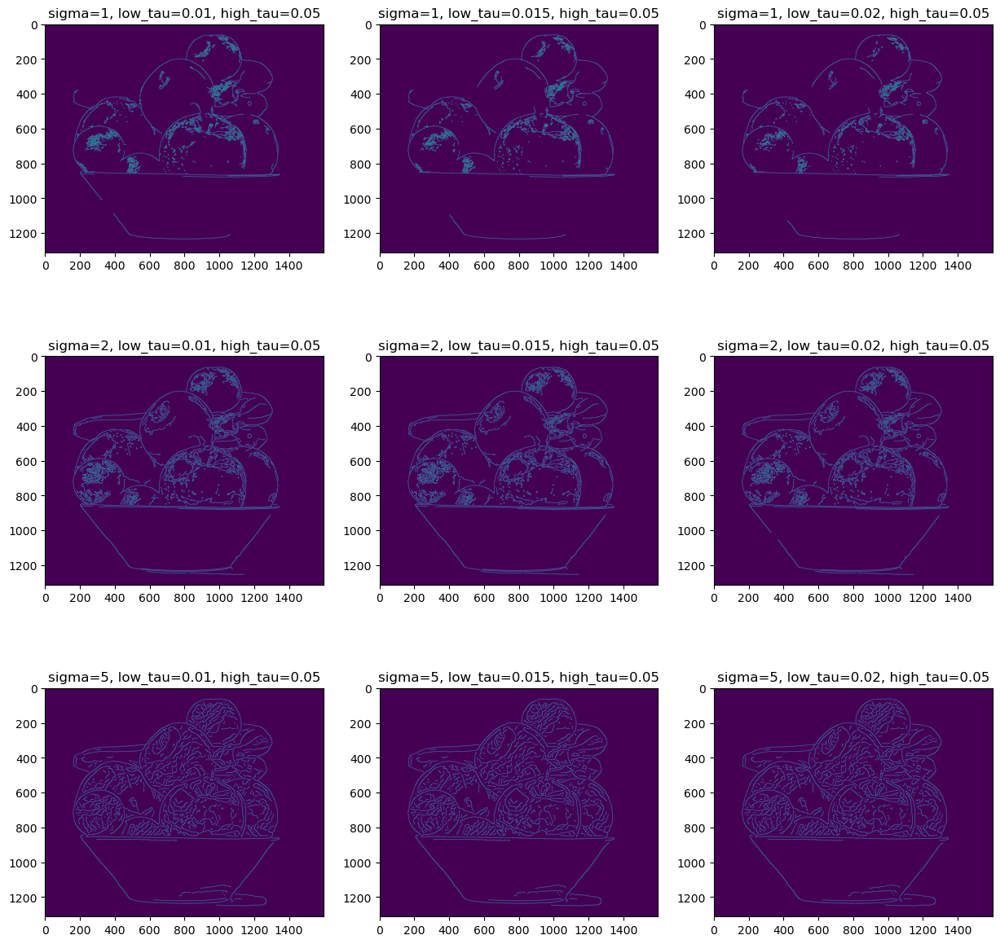

In [24]:
sigmas = [1, 2, 5]
low_taus = [0.01, 0.015, 0.02]
high_tau = 0.05
fig, ax = plt.subplots(nrows=len(sigmas), ncols=len(low_taus), figsize=(15, 15))
for i, s in enumerate(sigmas):
    for j, t in enumerate(low_taus):
        edges = MyCannyFull(img_gray, sigma=s, low_tau=t, high_tau=high_tau)
        ax[i, j].imshow(K.tensor_to_image(edges))
        ax[i, j].set_title(f"sigma={s}, low_tau={t}, high_tau={high_tau}")
plt.show()

## Another image

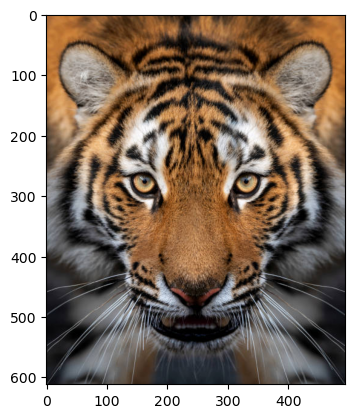

In [75]:
img_temp = plt.imread("tiger.jpg").astype(np.float32) / 255.0
plt.imshow(img_temp)
plt.show()

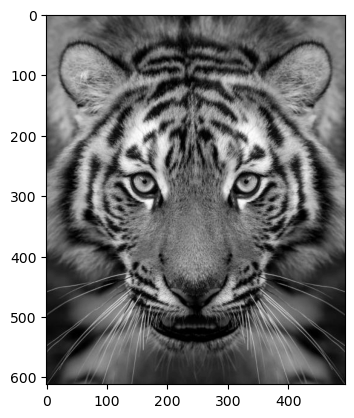

In [76]:
img_tensor = K.image_to_tensor(img_temp)
img_gray = K.color.rgb_to_grayscale(img_tensor).unsqueeze(0)
img_vis = K.tensor_to_image(img_gray)
plt.imshow(img_vis, 'gray')
plt.show()

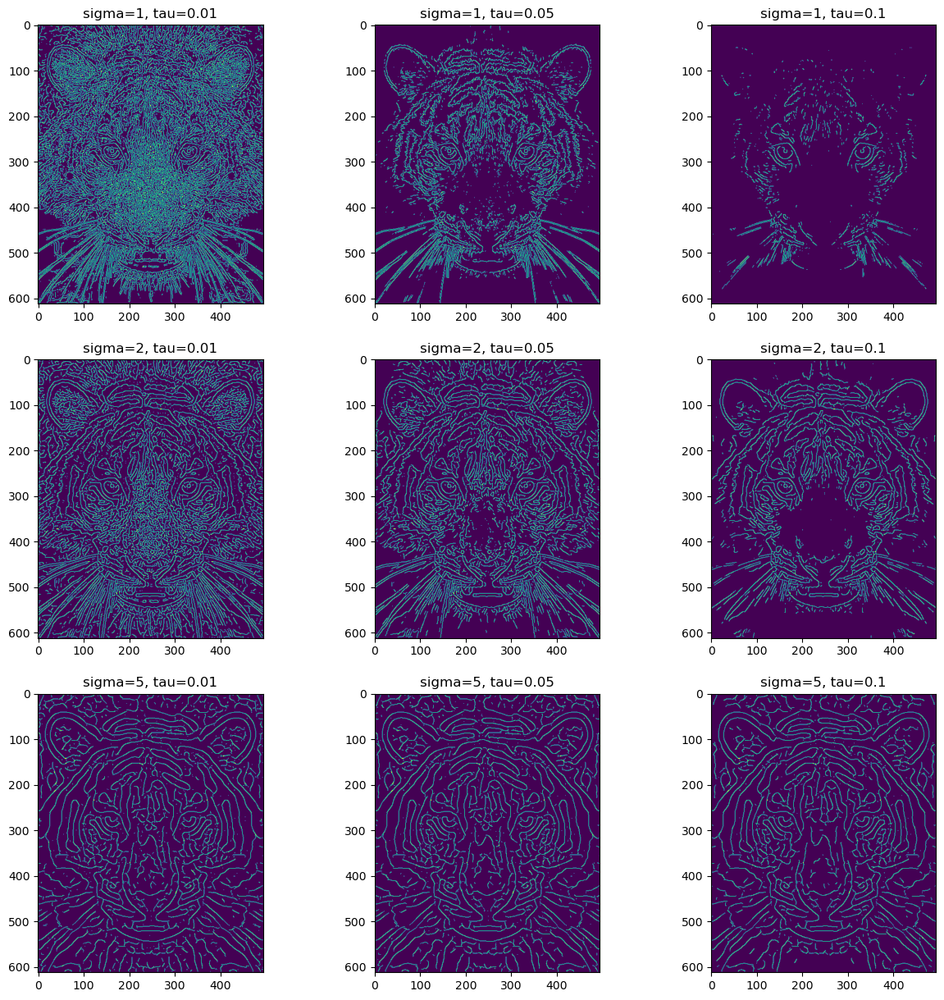

In [77]:
sigmas = [1, 2, 5]
taus = [0.01, 0.05, 0.1]
fig, ax = plt.subplots(nrows=len(sigmas), ncols=len(taus), figsize=(15, 15))
for i, s in enumerate(sigmas):
    for j, t in enumerate(taus):
        edges = MyCanny(img_gray, sigma=s, tau=t)
        ax[i, j].imshow(K.tensor_to_image(edges))
        ax[i, j].set_title(f"sigma={s}, tau={t}")
plt.show()

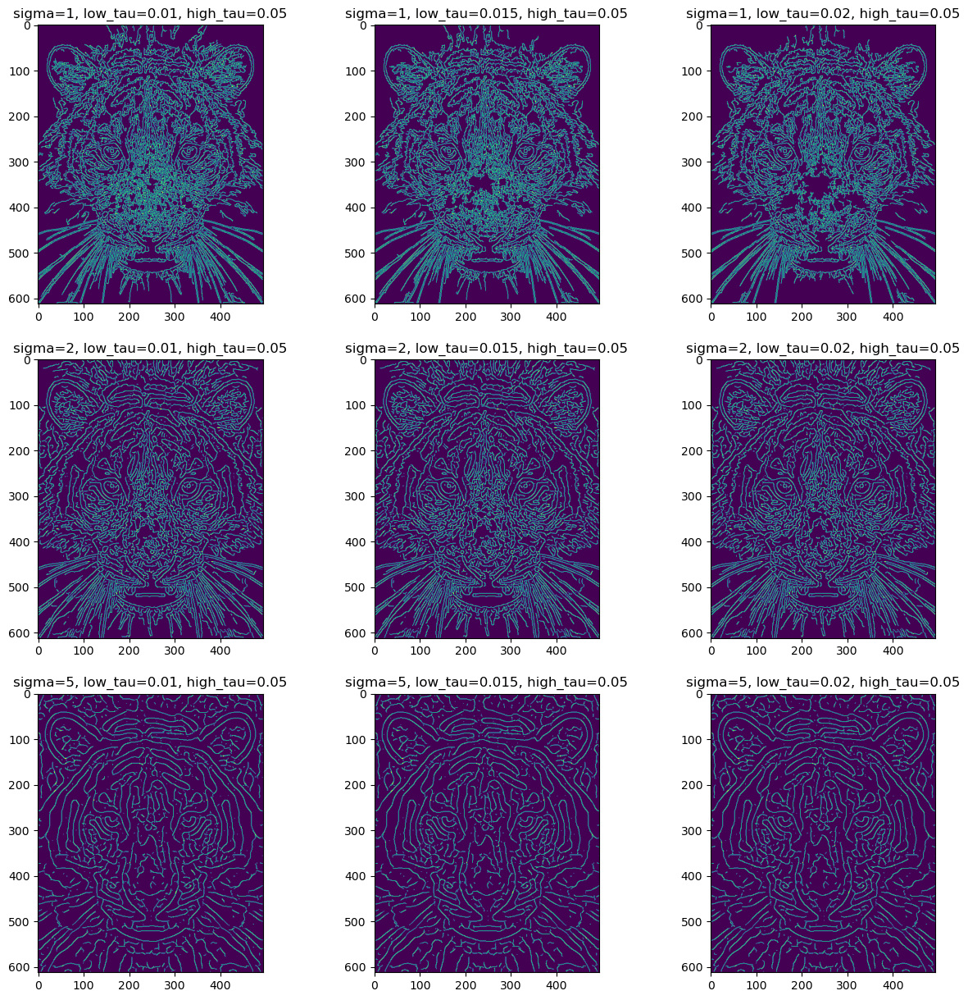

In [78]:
sigmas = [1, 2, 5]
low_taus = [0.01, 0.015, 0.02]
high_tau = 0.05
fig, ax = plt.subplots(nrows=len(sigmas), ncols=len(low_taus), figsize=(15, 15))
for i, s in enumerate(sigmas):
    for j, t in enumerate(low_taus):
        edges = MyCannyFull(img_gray, sigma=s, low_tau=t, high_tau=high_tau)
        ax[i, j].imshow(K.tensor_to_image(edges))
        ax[i, j].set_title(f"sigma={s}, low_tau={t}, high_tau={high_tau}")
plt.show()

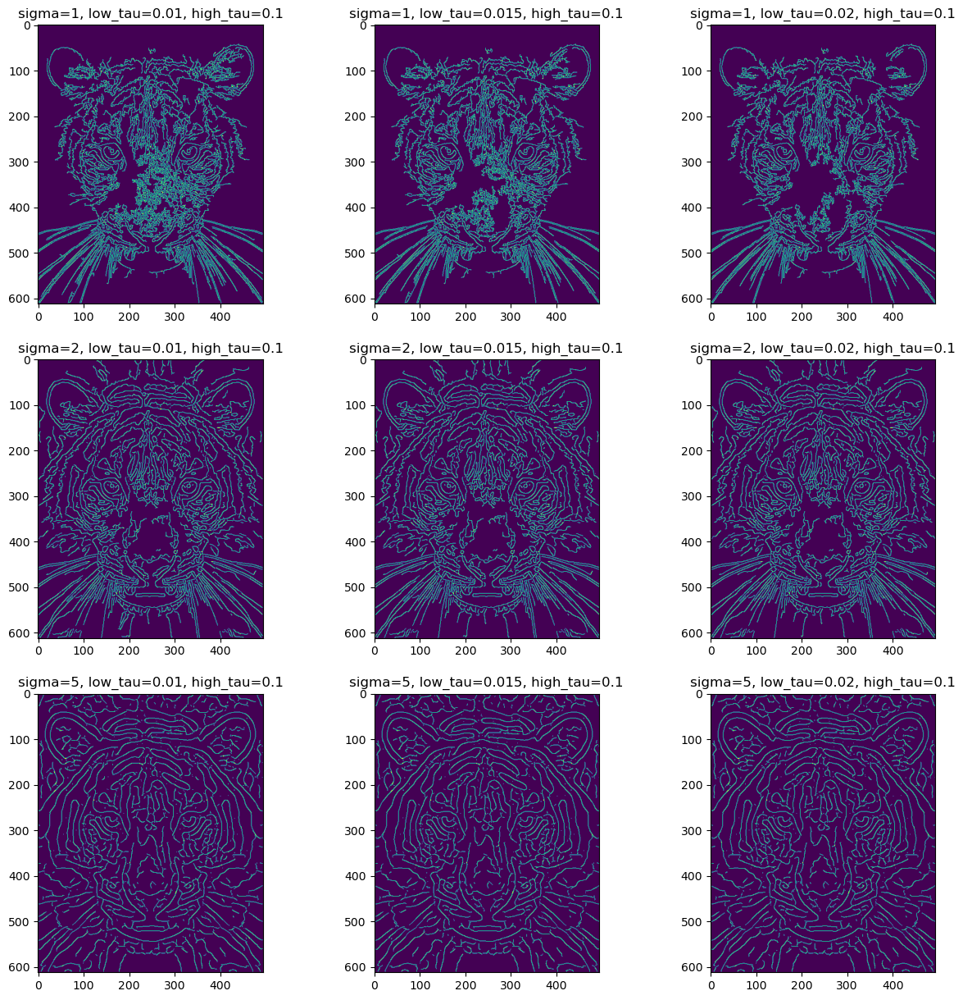

In [81]:
sigmas = [1, 2, 5]
low_taus = [0.01, 0.015, 0.02]
high_tau = 0.1
fig, ax = plt.subplots(nrows=len(sigmas), ncols=len(low_taus), figsize=(15, 15))
for i, s in enumerate(sigmas):
    for j, t in enumerate(low_taus):
        edges = MyCannyFull(img_gray, sigma=s, low_tau=t, high_tau=high_tau)
        ax[i, j].imshow(K.tensor_to_image(edges))
        ax[i, j].set_title(f"sigma={s}, low_tau={t}, high_tau={high_tau}")
plt.show()

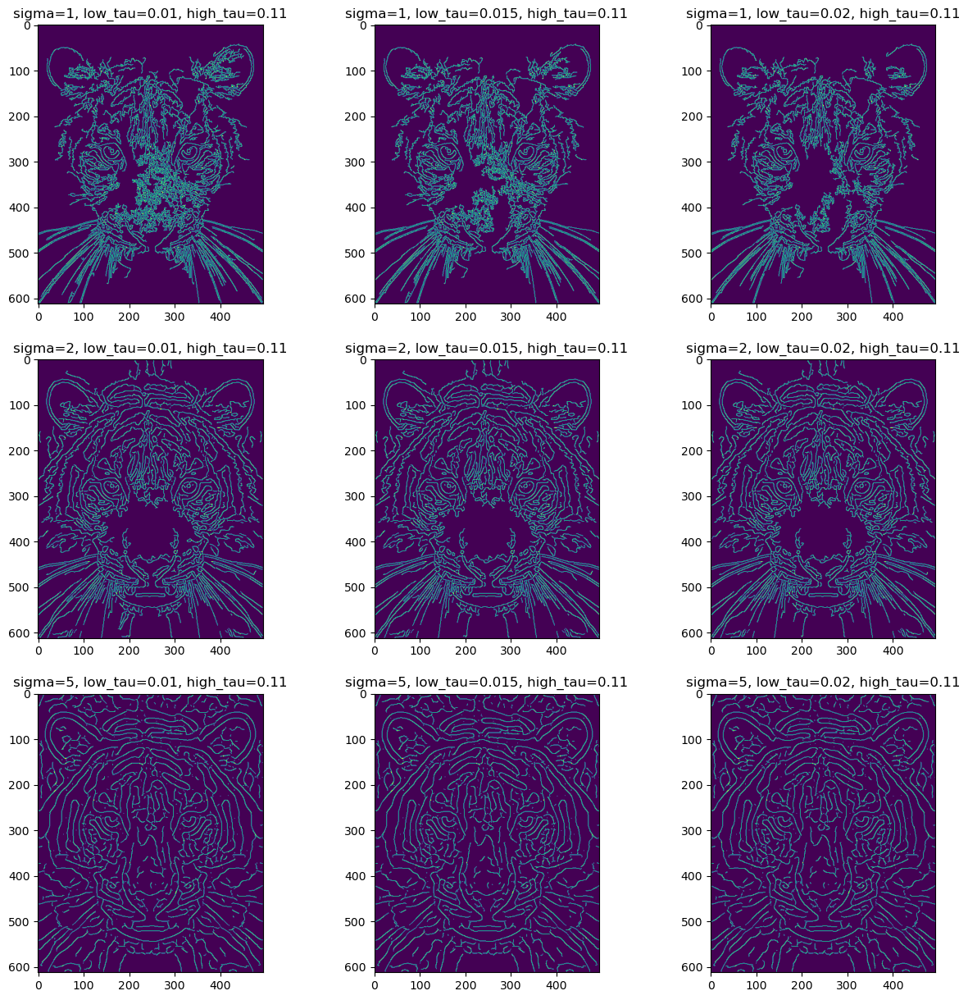

In [83]:
sigmas = [1, 2, 5]
low_taus = [0.01, 0.015, 0.02]
high_tau = 0.11
fig, ax = plt.subplots(nrows=len(sigmas), ncols=len(low_taus), figsize=(15, 15))
for i, s in enumerate(sigmas):
    for j, t in enumerate(low_taus):
        edges = MyCannyFull(img_gray, sigma=s, low_tau=t, high_tau=high_tau)
        ax[i, j].imshow(K.tensor_to_image(edges))
        ax[i, j].set_title(f"sigma={s}, low_tau={t}, high_tau={high_tau}")
plt.show()

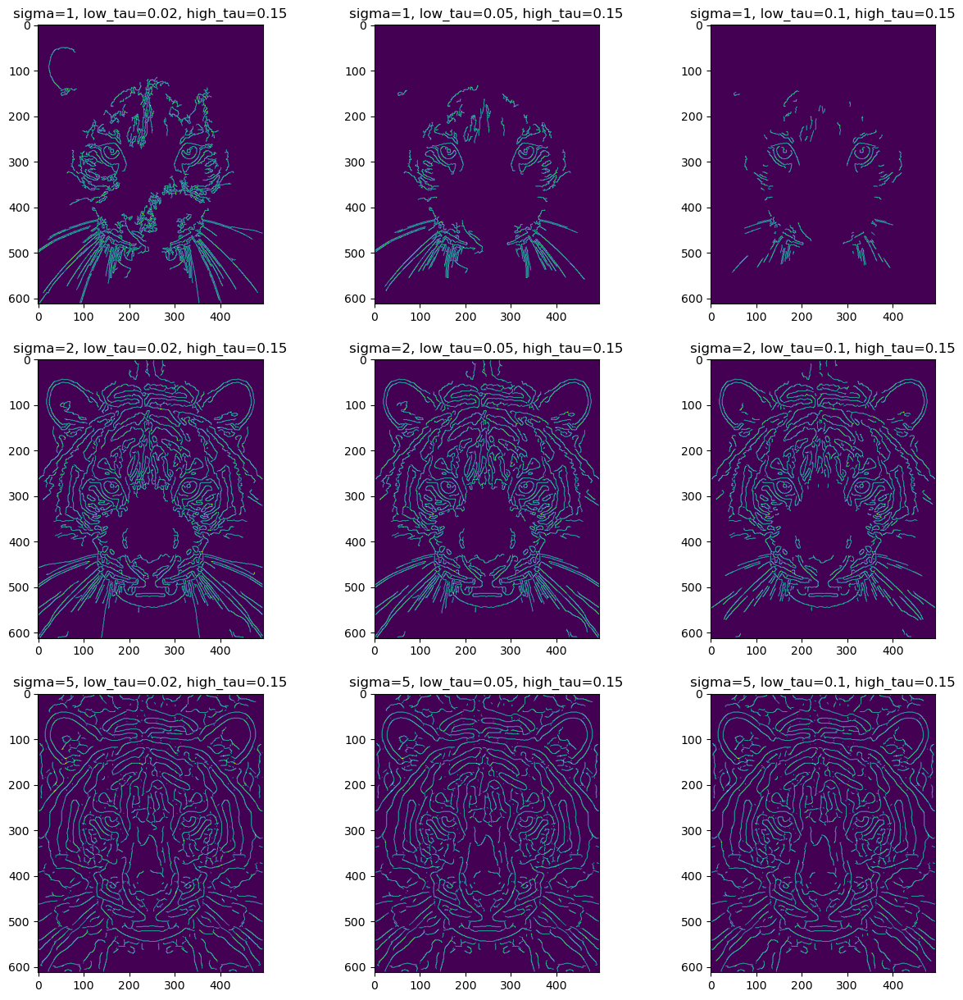

In [80]:
sigmas = [1, 2, 5]
low_taus = [0.02, 0.05, 0.1]
high_tau = 0.15
fig, ax = plt.subplots(nrows=len(sigmas), ncols=len(low_taus), figsize=(15, 15))
for i, s in enumerate(sigmas):
    for j, t in enumerate(low_taus):
        edges = MyCannyFull(img_gray, sigma=s, low_tau=t, high_tau=high_tau)
        ax[i, j].imshow(K.tensor_to_image(edges))
        ax[i, j].set_title(f"sigma={s}, low_tau={t}, high_tau={high_tau}")
plt.show()

## Best Params for the second image

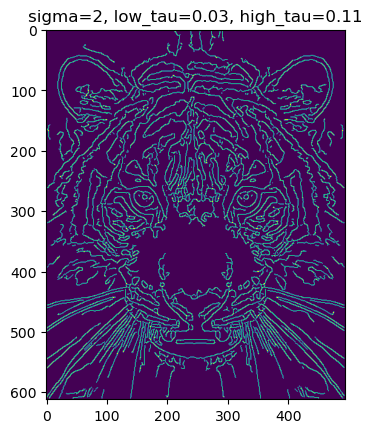

In [85]:
edges = MyCannyFull(img_gray, sigma=2, low_tau=0.02, high_tau=0.11)
plt.imshow(K.tensor_to_image(edges))
plt.title(f"sigma={2}, low_tau={0.03}, high_tau={0.11}")
plt.show()

# 2 Seam carving

## The input image

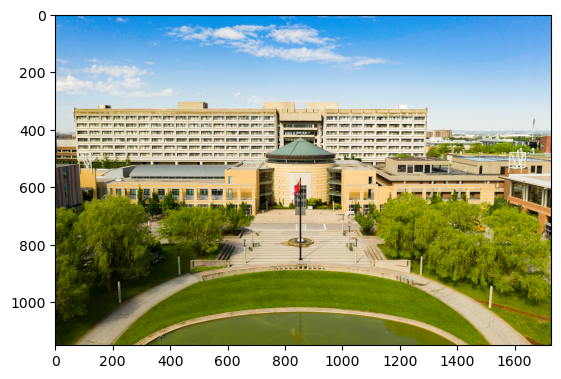

In [25]:
img_temp = plt.imread("York.jpg").astype(np.float32) / 255.0
img = K.image_to_tensor(img_temp).unsqueeze(0)
plt.imshow(img_temp)
plt.show()

## (a) Computing the energy image

In [26]:
def energy_calc(input_image):
    gradients = K.filters.spatial_gradient(input_image, mode='sobel', order=1, normalized=True) # shape = 1*3*2*H*W
    gradients_x = gradients[:, :, 0, :, :] # 1*3*H*W
    gradients_y = gradients[:, :, 1, :, :] # 1*3*H*W
    gradient_mag = torch.sqrt(gradients_x ** 2 + gradients_y ** 2) # 1*3*H*W
    E = torch.sum(gradient_mag, axis=1).unsqueeze(1)
    return E

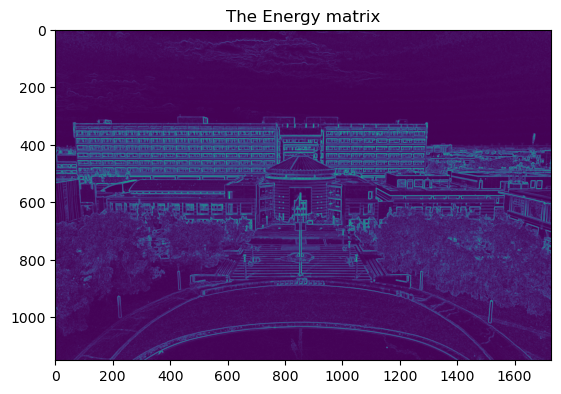

In [27]:
E = energy_calc(img)
plt.imshow(K.tensor_to_image(E))
plt.title("The Energy matrix")
plt.show()

## (b) Creating a scoring matrix

In [28]:
M = torch.zeros_like(E)

## (c) First row of the score matrix

In [29]:
M[0, 0, 0, :] = E[0, 0, 0, :]

## (d) Filling the rest of the score matrix

For this part, I first used two loops; One over the rows and one over the columns. This implementation worked, however, the code was super slow. So, I removed one of the loops, the one over the columns, and the improvment in execution time was amazing. Previously, removing each seam took around 80 seconds the for the second method it only takes around 0.33 seconds! So the total execution time was reduced from 10 hours to 3 minutes!!!! 

Explaining the removal of second loop: For each pixel of a loop, we take a minimum over three pixels from the previous row. We can do this simultaneously by separating the values of previous row three by three. These windows of size three overlap so a simple reshaping doesn't work. But torch actually has function for this which is the unfold function which takes the overlapping as input. After this separation, we take a minimum over elements of each window simultaneously. Note that the first and last pixel of each row will have a boundary problem. To get around this problem, I add a large enough element to the beggining and end of each row.

In [30]:
for i in range(1, M.shape[2]):
    
    prev_row = M[0, 0, i-1, :]
    null_val = prev_row.max() + 1.
    prev_row = torch.concat([torch.tensor([null_val]), prev_row, torch.tensor([null_val])])
    prev_row_unfolded = prev_row.unfold(0, 3, 1)
    prev_row_mins = torch.min(prev_row_unfolded, axis=1).values
    M[0, 0, i, :] = E[0, 0, i, :] + prev_row_mins
    
    #for j in range(1, M.shape[3]-1)
        #M[0, 0, i, j] = E[0, 0, i, j] + min(M[0, 0, i-1, j-1], M[0, 0, i-1, j], M[0, 0, i-1, j+1])
        #M[0, 0, i, 0] = E[0, 0, i, 0] + min(M[0, 0, i-1, 0], M[0, 0, i-1, 1])
        #M[0, 0, i, M.shape[3]-1] = E[0, 0, i, M.shape[3]-1] + min(M[0, 0, i-1, M.shape[3]-1], M[0, 0, i-1, M.shape[3]-2])

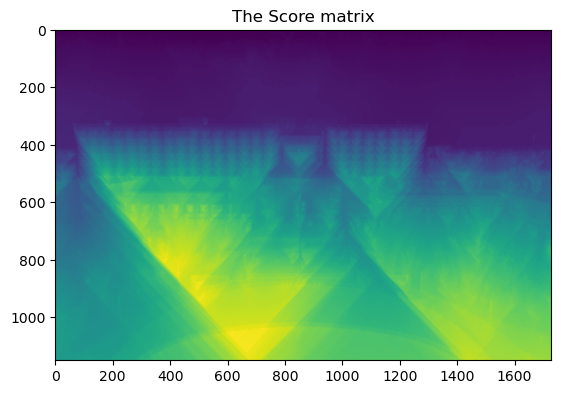

In [31]:
plt.imshow(K.tensor_to_image(M))
plt.title("The Score matrix")
plt.show()

## (e, f, g) Finding and removing the seam

For this part, I start from final row of the scoring matrix and trace back to the first row by the procedure outlined in the assignment document and slides. Along the way, I set values of the seam to a null value so that I can remove the seam afterwards by removing these null values. Looking at it now, this wasn't necessary and I could have create a new matrix after each iteration.

In [32]:
img_copy = torch.clone(img)
null_val = img_copy.min() - 1
idx = M[0, 0, -1, :].argmin()
img_copy[0, :, -1, idx] = null_val
#counter = 1
for i in range(img_copy.shape[2]-2, -1, -1):
    # print(M[0, 0, i, idx-1:idx+2])
    if idx > 0 and idx < M.shape[3]-1:
        idx = idx + torch.argmin(M[0, 0, i, idx-1:idx+2]) - 1
        
    elif idx == 0:
        idx = idx + torch.argmin(M[0, 0, i, idx:idx+2])
    
    else:
        idx = idx + torch.argmin(M[0, 0, i, idx-1:idx+1]) - 1
    
    img_copy[0, :, i, idx] = null_val
    #counter += 1

img_copy = img_copy[img_copy > null_val]
img_copy = img_copy.reshape((1, 3, img.shape[2],img.shape[3]-1))

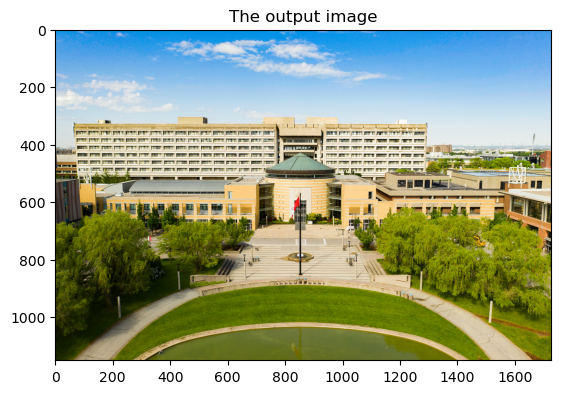

In [33]:
plt.imshow(K.tensor_to_image(img_copy))
plt.title("The output image")
plt.show()

## Putting it all together, *CarvingHelper*

Finally, I put all previous functions in the CarvingHelper. This function takes an image as input and removes a seam from it. If the user wants to do a horizontal seam carving, they should set the horizontal attribute to True. This way, the input image is transposed and then a vertical seam carving is done and then the output is transposed again and returned.

In [34]:
def CarvingHelper(image, horizontal=False):
    if horizontal:
        image = torch.permute(image, (0, 1, 3, 2))
    
    gradients = K.filters.spatial_gradient(image, mode='sobel', order=1, normalized=True) # shape = 1*3*2*H*W
    gradients_x = gradients[:, :, 0, :, :] # 1*3*H*W
    gradients_y = gradients[:, :, 1, :, :] # 1*3*H*W
    gradient_mag = torch.sqrt(gradients_x ** 2 + gradients_y ** 2) # 1*3*H*W
    E = torch.sum(gradient_mag, axis=1).unsqueeze(1)
    
    M = torch.zeros_like(E)
    M[0, 0, 0, :] = E[0, 0, 0, :]
    
    for i in range(1, M.shape[2]):
    
        prev_row = M[0, 0, i-1, :]
        null_val = prev_row.max() + 1.
        prev_row = torch.concat([torch.tensor([null_val]), prev_row, torch.tensor([null_val])])
        # print(prev_row.shape)
        prev_row_unfolded = prev_row.unfold(0, 3, 1)
        prev_row_mins = torch.min(prev_row_unfolded, axis=1).values
        M[0, 0, i, :] = E[0, 0, i, :] + prev_row_mins
    
    img_copy = torch.clone(image)
    null_val = img_copy.min() - 1
    idx = M[0, 0, -1, :].argmin()
    img_copy[0, :, -1, idx] = null_val
    
    for i in range(img_copy.shape[2]-2, -1, -1):

        if idx > 0 and idx < M.shape[3]-1:
            idx = idx + torch.argmin(M[0, 0, i, idx-1:idx+2]) - 1

        elif idx == 0:
            idx = idx + torch.argmin(M[0, 0, i, idx:idx+2])

        else:
            idx = idx + torch.argmin(M[0, 0, i, idx-1:idx+1]) - 1

        img_copy[0, :, i, idx] = null_val

    img_copy = img_copy[img_copy > null_val]
    img_copy = img_copy.reshape((1, 3, image.shape[2],image.shape[3]-1))
    
    if horizontal:
        img_copy = torch.permute(img_copy, (0, 1, 3, 2))
    
    return img_copy

## Testing the code

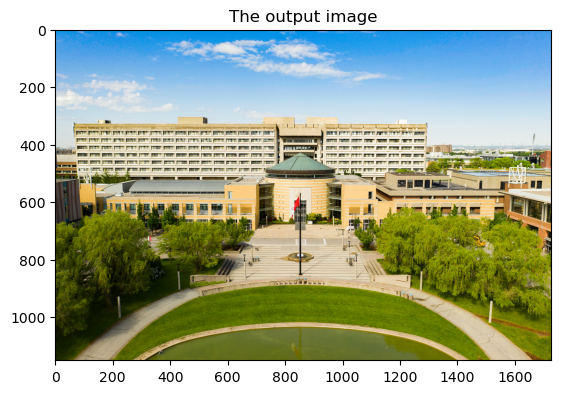

In [35]:
img_out1 = CarvingHelper(img, horizontal=False)
plt.imshow(K.tensor_to_image(img_out1))
plt.title("The output image")
plt.show()

In [36]:
print(img.shape, img_out1.shape)

torch.Size([1, 3, 1151, 1728]) torch.Size([1, 3, 1151, 1727])


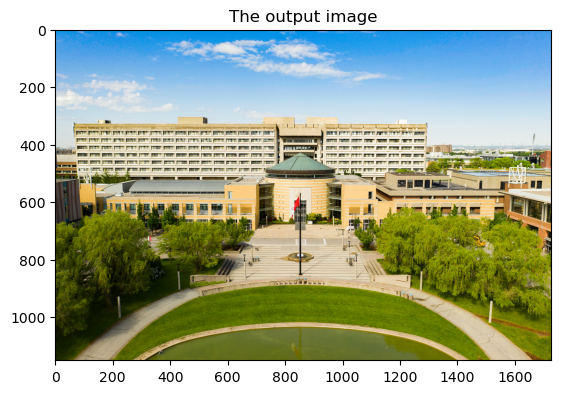

In [37]:
img_out2 = CarvingHelper(img, horizontal=True)
plt.imshow(K.tensor_to_image(img_out1))
plt.title("The output image")
plt.show()

In [38]:
print(img.shape, img_out2.shape)

torch.Size([1, 3, 1151, 1728]) torch.Size([1, 3, 1150, 1728])


## MySeamCarving

This function takes an image, and the final desired shape as input and calls the CarvingHelper function "enough" times to get the desired shape.

In [39]:
def MySeamCarving(image, desired_h, desired_w):
    
    _, _, h, w = image.shape
    
    assert desired_h <= h
    assert desired_w <= w
    
    n_vertical_seams = w - desired_w
    n_horizontal_seams = h - desired_h
    
    for i in tqdm(range(n_vertical_seams)):
        image = CarvingHelper(image, horizontal=False)
    for j in tqdm(range(n_horizontal_seams)):
        image = CarvingHelper(image, horizontal=True)
    
    return image

## Resizing the input image to 1151*1200

In [40]:
out1 = MySeamCarving(img, 1151, 1200)

100%|█████████████████████████████████████████| 528/528 [02:49<00:00,  3.12it/s]
0it [00:00, ?it/s]


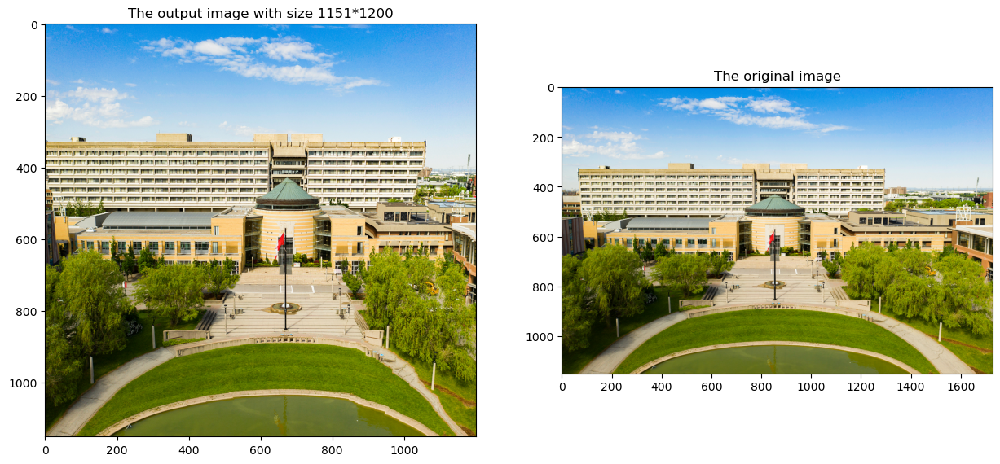

In [45]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 20))

ax[0].imshow(K.tensor_to_image(out1))
ax[0].set_title("The output image with size 1151*1200")

ax[1].imshow(K.tensor_to_image(img))
ax[1].set_title("The original image")

plt.show()

## Saving the output images both in npy and in jpeg format

In [46]:
np.save('out1.npy', K.tensor_to_image(out1))

In [47]:
plt.imsave('out1.jpg', K.tensor_to_image(out1))

## Resizing the input image to 720*1728

In [48]:
out2 = MySeamCarving(img, 720, 1728)

0it [00:00, ?it/s]
100%|█████████████████████████████████████████| 431/431 [02:49<00:00,  2.55it/s]


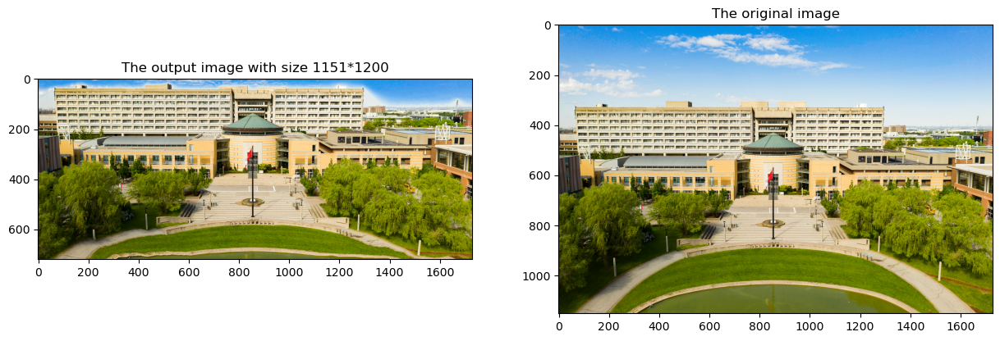

In [49]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 20))

ax[0].imshow(K.tensor_to_image(out2))
ax[0].set_title("The output image with size 1151*1200")

ax[1].imshow(K.tensor_to_image(img))
ax[1].set_title("The original image")

plt.show()

## Saving the output images both in npy and in jpeg format

In [50]:
np.save('out2.npy', K.tensor_to_image(out2))

In [51]:
plt.imsave('out2.jpg', K.tensor_to_image(out2))

## Same procedure for a selected image

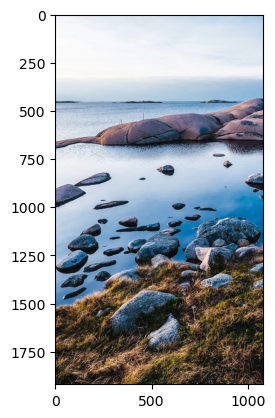

In [52]:
myimg_temp = plt.imread("myimage.jpg").astype(np.float32) / 255.0
myimg = K.image_to_tensor(myimg_temp).unsqueeze(0)
plt.imshow(myimg_temp)
plt.show()

In [53]:
out3 = MySeamCarving(myimg, 1500, 1000)

100%|█████████████████████████████████████████| 420/420 [02:18<00:00,  3.02it/s]


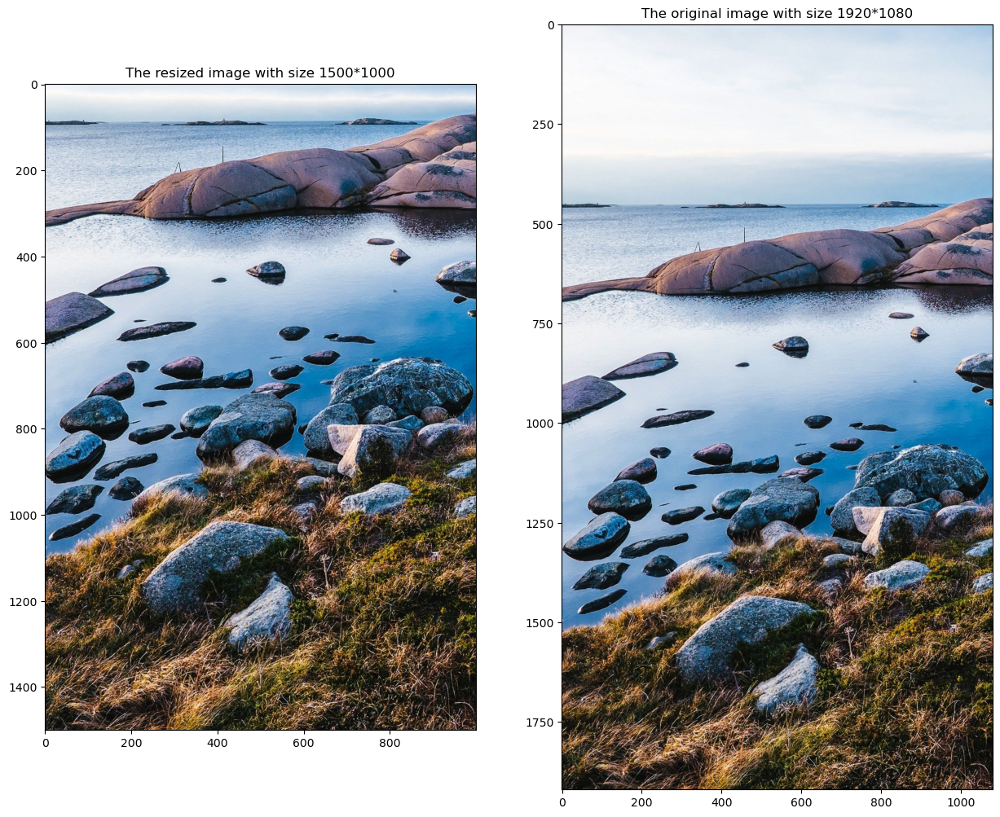

In [58]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 20))

ax[0].imshow(K.tensor_to_image(out3))
ax[0].set_title("The resized image with size 1500*1000")

ax[1].imshow(K.tensor_to_image(myimg))
ax[1].set_title("The original image with size 1920*1080")

plt.show()

In [59]:
plt.imsave('out3.jpg', K.tensor_to_image(out3))

## Enlarging an image using seam carving

In the paper they propose two ways to enlarge an image. One way is to find a seam and then duplicate it and then find another one and duplicate it and so on. But they show that if one uses this method, they will find the same seam and duplicate that one. To get a better result, they first find K seams and the duplicate them. So, I implemented the second method. In the following code, original_image is used for finding seams which is getting smaller and smaller and the enlarge matrix is the one that gets larger and larger.

In [64]:
def CarvingHelperModified(original_image, enlarged_image, horizontal=False):
    if horizontal:
        original_image = torch.permute(original_image, (0, 1, 3, 2))
        enlarged_image = torch.permute(enlarged_image, (0, 1, 3, 2))
    
    enlarged_again_image = torch.zeros((1, enlarged_image.shape[1], enlarged_image.shape[2], enlarged_image.shape[3]+1), dtype=enlarged_image.dtype)
    
    gradients = K.filters.spatial_gradient(original_image, mode='sobel', order=1, normalized=True) # shape = 1*3*2*H*W
    gradients_x = gradients[:, :, 0, :, :] # 1*3*H*W
    gradients_y = gradients[:, :, 1, :, :] # 1*3*H*W
    gradient_mag = torch.sqrt(gradients_x ** 2 + gradients_y ** 2) # 1*3*H*W
    E = torch.sum(gradient_mag, axis=1).unsqueeze(1)
    
    M = torch.zeros_like(E)
    M[0, 0, 0, :] = E[0, 0, 0, :]
    
    for i in range(1, M.shape[2]):
    
        prev_row = M[0, 0, i-1, :]
        null_val = prev_row.max() + 1.
        prev_row = torch.concat([torch.tensor([null_val]), prev_row, torch.tensor([null_val])])
        # print(prev_row.shape)
        prev_row_unfolded = prev_row.unfold(0, 3, 1)
        prev_row_mins = torch.min(prev_row_unfolded, axis=1).values
        M[0, 0, i, :] = E[0, 0, i, :] + prev_row_mins
    
    img_copy = torch.clone(original_image)
    null_val = img_copy.min() - 1
    idx = M[0, 0, -1, :].argmin()
    img_copy[0, :, -1, idx] = null_val
    
    for i in range(img_copy.shape[2]-2, -1, -1):

        if idx > 0 and idx < M.shape[3]-1:
            idx = idx + torch.argmin(M[0, 0, i, idx-1:idx+2]) - 1
            enlarged_again_image[0, :, i, :idx] = enlarged_image[0, :, i, :idx]
            enlarged_again_image[0, :, i, idx+1:] = enlarged_image[0, :, i, idx:]
            enlarged_again_image[0, :, i, idx] = (enlarged_image[0, :, i, idx] + enlarged_image[0, :, i, idx-1] + enlarged_image[0, :, i, idx+1]) / 3

        elif idx == 0:
            idx = idx + torch.argmin(M[0, 0, i, idx:idx+2])
            enlarged_again_image[0, :, i, :idx] = enlarged_image[0, :, i, :idx]
            enlarged_again_image[0, :, i, idx+1:] = enlarged_image[0, :, i, idx:]
            enlarged_again_image[0, :, i, idx] = (enlarged_image[0, :, i, idx] + enlarged_image[0, :, i, idx+1]) / 2

        else:
            idx = idx + torch.argmin(M[0, 0, i, idx-1:idx+1]) - 1
            enlarged_again_image[0, :, i, :idx] = enlarged_image[0, :, i, :idx]
            enlarged_again_image[0, :, i, idx+1:] = enlarged_image[0, :, i, idx:]
            enlarged_again_image[0, :, i, idx] = (enlarged_image[0, :, i, idx] + enlarged_image[0, :, i, idx-1]) / 2
            
        img_copy[0, :, i, idx] = null_val
        

    img_copy = img_copy[img_copy > null_val]
    img_copy = img_copy.reshape((1, 3, original_image.shape[2],original_image.shape[3]-1))
    
    if horizontal:
        img_copy = torch.permute(img_copy, (0, 1, 3, 2))
        enlarged_again_image = torch.permute(enlarged_again_image, (0, 1, 3, 2))
    
    return img_copy, enlarged_again_image

In [68]:
def MySeamCarvingModified(image, desired_h, desired_w):
    
    _, _, h, w = image.shape
    
    assert desired_h >= h
    assert desired_w >= w
    
    n_vertical_seams = desired_w - w
    n_horizontal_seams = desired_h -h
    
    enlarged_image = torch.clone(image)
    
    for i in tqdm(range(n_vertical_seams)):
        image, enlarged_image = CarvingHelperModified(image, enlarged_image, horizontal=False)
    image = torch.clone(enlarged_image)
    for j in tqdm(range(n_horizontal_seams)):
        image, enlarged_image = CarvingHelperModified(image, enlarged_image, horizontal=True)
    
    return enlarged_image

In [69]:
out4 = MySeamCarvingModified(img, 1400, 1900)

100%|█████████████████████████████████████████| 249/249 [03:02<00:00,  1.36it/s]


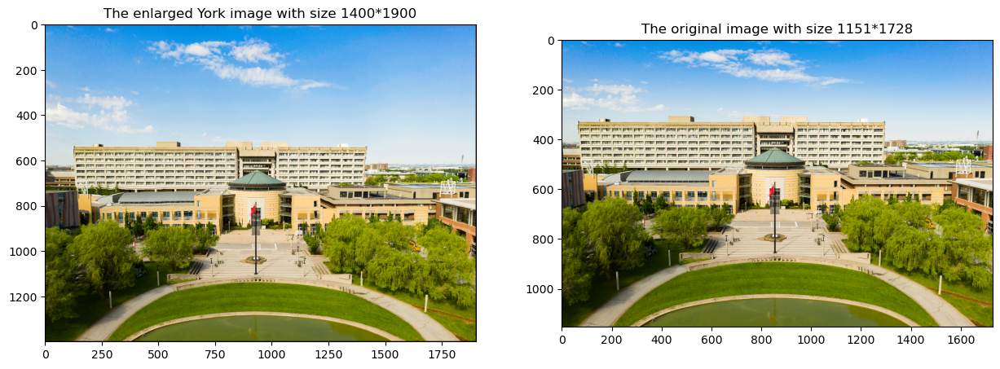

In [70]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 20))

ax[0].imshow(K.tensor_to_image(out4))
ax[0].set_title("The enlarged York image with size 1400*1900")

ax[1].imshow(K.tensor_to_image(img))
ax[1].set_title("The original image with size 1151*1728")

plt.show()

In [71]:
plt.imsave('out4.jpg', K.tensor_to_image(out4))

## Failure of the enlargment method for more enlargment

In [72]:
out5 = MySeamCarvingModified(img, 1600, 2100)

100%|█████████████████████████████████████████| 449/449 [06:02<00:00,  1.24it/s]


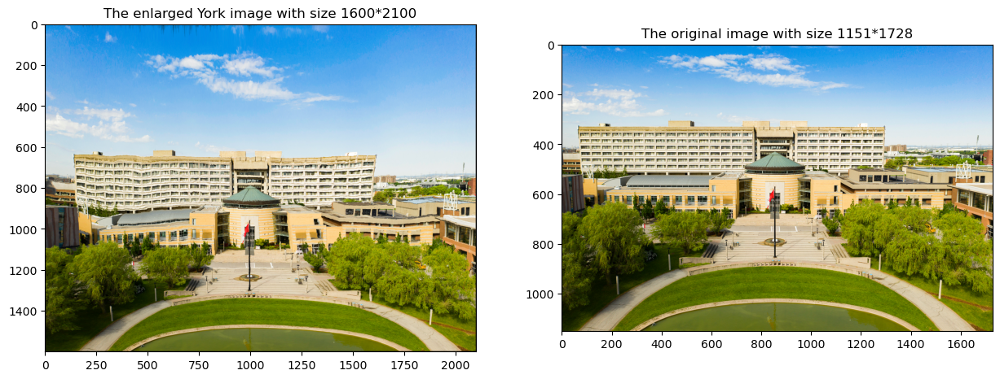

In [73]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 20))

ax[0].imshow(K.tensor_to_image(out5))
ax[0].set_title("The enlarged York image with size 1600*2100")

ax[1].imshow(K.tensor_to_image(img))
ax[1].set_title("The original image with size 1151*1728")

plt.show()

In [74]:
plt.imsave('out5.jpg', K.tensor_to_image(out5))